# Need colouring for HM 

# Import packages

In [1]:
import os
import sys
%matplotlib inline
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import datetime

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=300, dpi_save=300)

# input data and metadata

In [2]:
data_path = '/lustre/scratch117/cellgen/team298/SharedFolders/ar32/YS/main_data_with_WE_added/A2_V7_scvi_V8_model_selected_raw_qc_scr_umap_with_broad_labels.h5ad'

metadata_input = '' # leave blank if don't want to use

adata = sc.read(data_path)

if len(metadata_input) == 0:
    pass
else:
    metadata = pd.read_csv(metadata_input, index_col=0)
    adata = adata[adata.obs.index.isin(list(metadata.index))]
    adata.obs = metadata

# Update metadata

In [3]:
adata.obs['orig.dataset_updated'] = adata.obs['orig.dataset'].astype(str)
adata.obs.loc[adata.obs['fetal.ids'].isin(['F61']), 'orig.dataset_updated'] = 'Suo_et_al_BioRxiv_2022'
adata.obs.loc[adata.obs['orig.dataset_updated'].isin(['WE_YS']), 'orig.dataset_updated'] = 'De_novo'
adata.obs.groupby(['orig.dataset_updated','fetal.ids']).apply(len)

orig.dataset_updated            fetal.ids
De_novo                         F79          40585
                                F80          21246
                                F138         31680
HM_YS                           mikola_1      6256
Popescu_et_al_Nature_2019       F32           1001
                                F35           1383
                                F37          10729
Suo_et_al_BioRxiv_2022          F61          45945
Wang_et_al_Cell_Stem Cell_2021  Wang_CS10     3615
                                Wang_CS11     7054
dtype: int64

/home/jovyan/my-conda-envs/YS_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


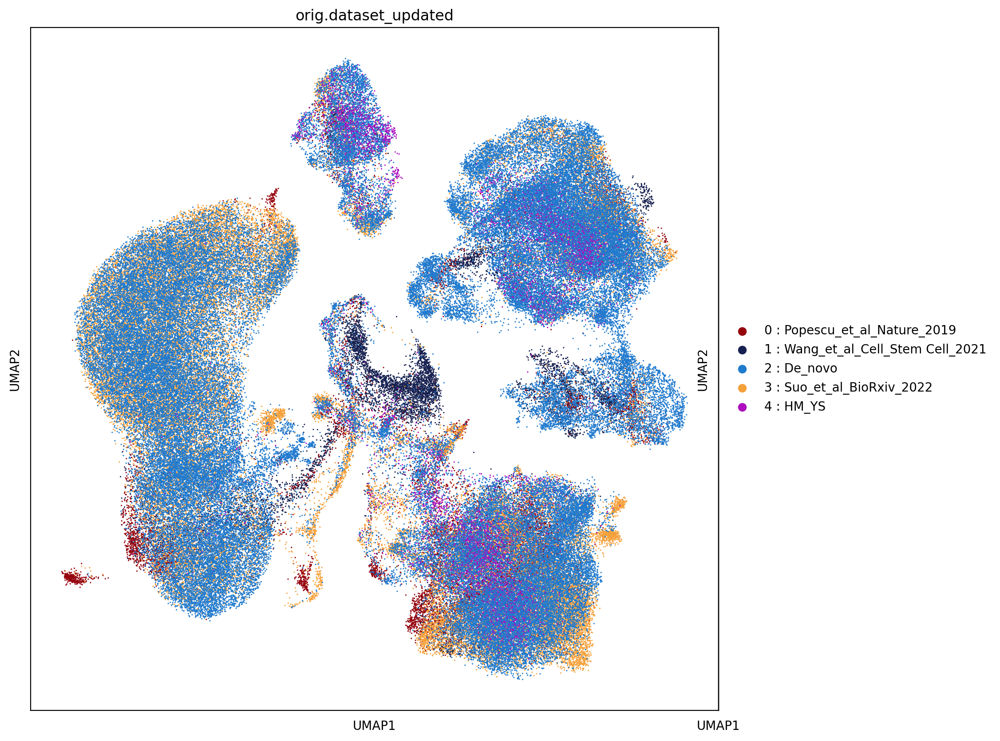

In [8]:
var = "orig.dataset_updated"
#Create color dictionary
cells = ['Popescu_et_al_Nature_2019','Wang_et_al_Cell_Stem Cell_2021', 'De_novo', 'Suo_et_al_BioRxiv_2022','HM_YS',]
col = list(range(0, len(adata.obs[var].unique())))
#col = adata.uns['cell.labels_colors']
dic = dict(zip(cells,col))
#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)
col_pal = ["#95030D","#172151","#207ACE", "#F5A13B",'#AD0DBF'] 

#adata.obs['num'] = adata.obs['num'].astype('category')
#adata.obs['num'] = adata.obs['num'].cat.reorder_categories(['3','0','1','2'])
#adata.obs['num'] = adata.obs['num'].astype(str)

import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this
fig, (ax1, ax2,) = plt.subplots(1,2, figsize=(10,10), gridspec_kw={'wspace':0,'width_ratios': [1,0]})
p2 = sc.pl.umap(adata, color = (var+'_num') ,ax=ax2,show=False,title="", palette= col_pal) #title=i
p3 = sc.pl.umap(adata, color = "num",legend_loc=None,size=5,legend_fontsize='small',ax=ax1,show=False, palette= col_pal, title=var, groups=['3','0','1','2','4','5']) #title=i
fig.savefig("./figures/ext1a_umap_v1_20220623.pdf",bbox_inches='tight')

/home/jovyan/my-conda-envs/YS_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


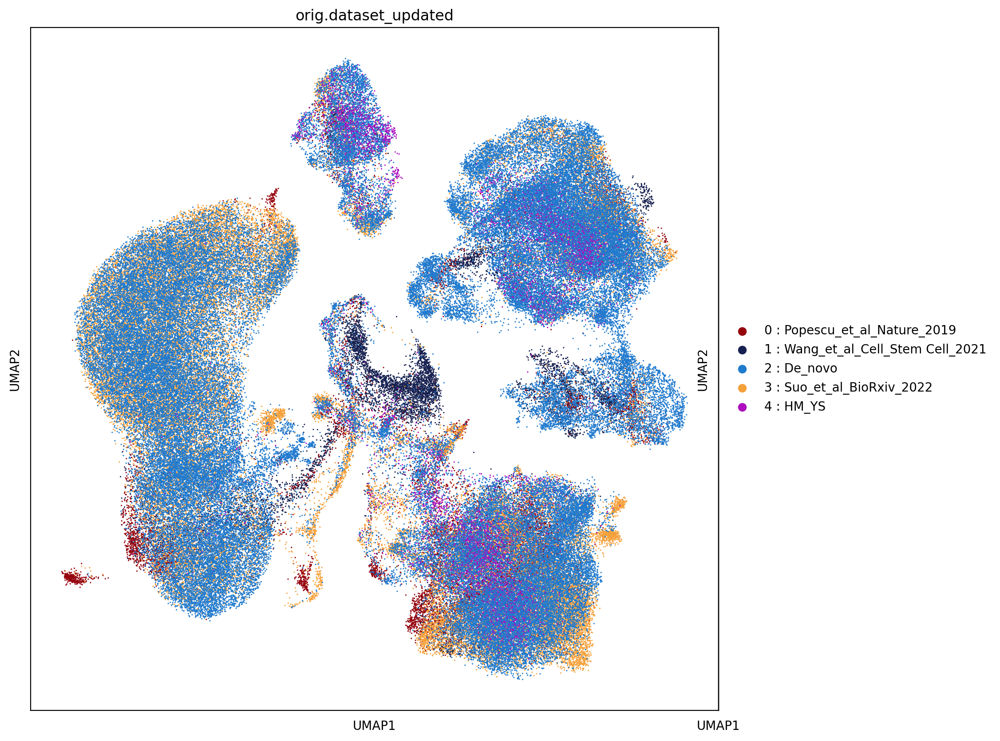

In [9]:
var = "orig.dataset_updated"
#Create color dictionary
cells = ['Popescu_et_al_Nature_2019','Wang_et_al_Cell_Stem Cell_2021', 'De_novo', 'Suo_et_al_BioRxiv_2022','HM_YS']
col = list(range(0, len(adata.obs[var].unique())))
#col = adata.uns['cell.labels_colors']
dic = dict(zip(cells,col))
#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)
col_pal = ["#95030D","#172151","#207ACE", "#F5A13B",'#AD0DBF'] 

#adata.obs['num'] = adata.obs['num'].astype('category')
#adata.obs['num'] = adata.obs['num'].cat.reorder_categories(['3','0','1','2'])
#adata.obs['num'] = adata.obs['num'].astype(str)

import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this
fig, (ax1, ax2,) = plt.subplots(1,2, figsize=(10,10), gridspec_kw={'wspace':0,'width_ratios': [1,0]})
p2 = sc.pl.umap(adata, color = (var+'_num') ,ax=ax2,show=False,title="", palette= col_pal) #title=i
p3 = sc.pl.umap(adata, color = "num",legend_loc=None,size=5,legend_fontsize='small',ax=ax1,show=False, palette= col_pal, title=var, groups=['3','0','1','2','4','5']) #title=i
fig.savefig("./figures/ext1a_umap_v2_20220623.pdf",bbox_inches='tight')

In [35]:
adata.obs['component'].value_counts(dropna=False)

Membrane       107436
VA              35375
YS              14663
Contents         5764
YolkSac          5023
Vitelline V      1233
Name: component, dtype: int64

In [36]:
adata.obs.groupby(['component','orig.dataset_updated']).apply(len)

component    orig.dataset_updated          
Contents     Popescu_et_al_Nature_2019          5764
Membrane     De_novo                           43473
             Popescu_et_al_Nature_2019          7349
             Suo_et_al_BioRxiv_2022            45945
             Wang_et_al_Cell_Stem Cell_2021    10669
VA           De_novo                           18358
             WE_YS                             17017
Vitelline V  HM_YS                              1233
YS           WE_YS                             14663
YolkSac      HM_YS                              5023
dtype: int64

In [37]:
# ys and yolksac to membrane 
# vitelline to va

adata.obs.replace({'component':'Vitelline V'},'VA',inplace=True)
adata.obs.replace({'component':'YS'},'Membrane',inplace=True)
adata.obs.replace({'component':'YolkSac'},'Membrane',inplace=True)

In [38]:
celltypes = ['Contents', 'VA', 'Membrane']
adata.obs['component'] = adata.obs['component'].cat.reorder_categories(celltypes)

#create numpy array for colours for each celltype to use
new_colors = np.empty(len(adata.obs["component"].cat.categories), dtype=object) 

#assign the colours for each category - will be in the same order as plotted so if wwant to reorder do before this stage as colour positions won't move
new_colors[[0]] = '#85050d' # Contents
new_colors[[1]] = '#f5232f' # VA
new_colors[[2]] = '#F4B973' # Membrane

#save colour assigned numpy array in uns
adata.uns["component_colors"] = new_colors # remember to keep '_colors' at the end of the column of plotting interest!

In [39]:
adata.obs["component"].value_counts()

Membrane    127122
VA           36608
Contents      5764
Name: component, dtype: int64

/home/jovyan/my-conda-envs/YS_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


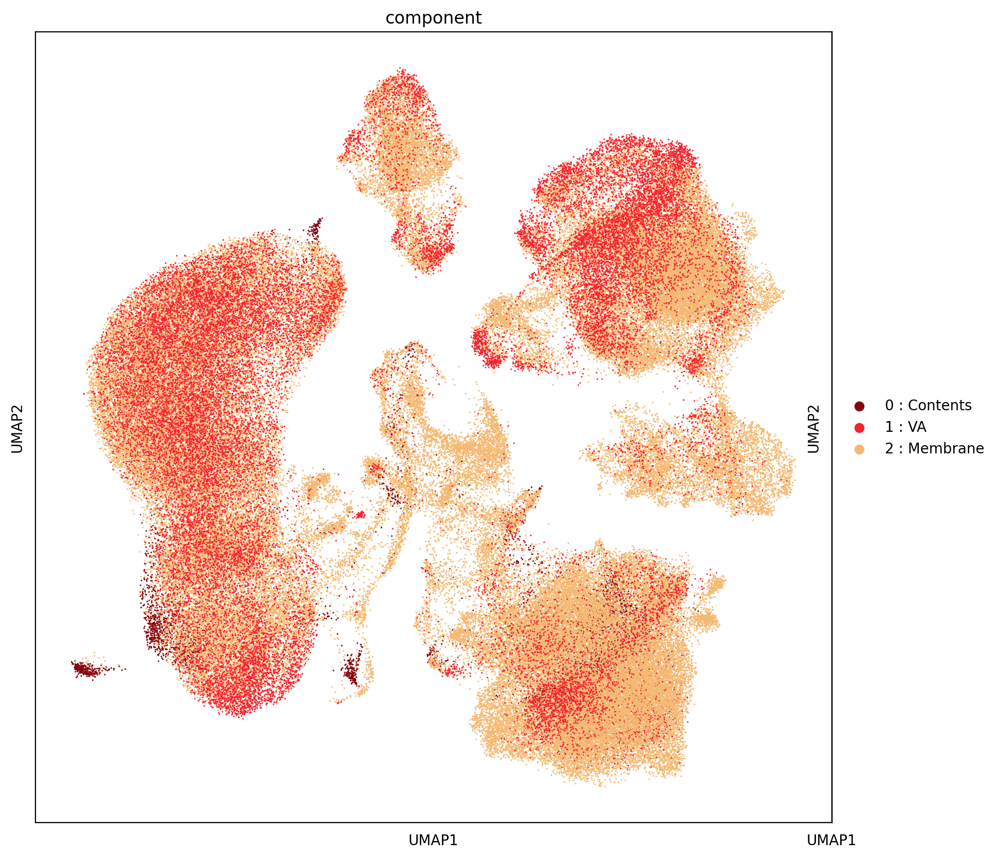

In [40]:
var = "component"
#Create color dictionary
cells = ['Contents', 'VA', 'Membrane',]
col = list(range(0, len(adata.obs[var].unique())))
#col = adata.uns['cell.labels_colors']
dic = dict(zip(cells,col))
#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)
col_pal = ['#85050d','#f5232f','#F4B973'] 

adata.obs['num'] = adata.obs['num'].astype('category')
adata.obs['num'] = adata.obs['num'].cat.reorder_categories(['0','1','2'])
adata.obs['num'] = adata.obs['num'].astype(str)

import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this
fig, (ax1, ax2,) = plt.subplots(1,2, figsize=(10,10), gridspec_kw={'wspace':0,'width_ratios': [1,0]})
p2 = sc.pl.umap(adata, color = (var+'_num') ,ax=ax2,show=False,title="", palette= col_pal) #title=i
p3 = sc.pl.umap(adata, color = "num",legend_loc=None,size=5,legend_fontsize='small',ax=ax1,show=False, palette= col_pal, title=var, groups=['3','0','1','2']) #title=i
fig.savefig("./figures/contents_va_membrane_umap.pdf",bbox_inches='tight')

# Import packages

In [1]:
import os
import sys
%matplotlib inline
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import datetime

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=300, dpi_save=300)

# input data and metadata

In [2]:
data_path = '/lustre/scratch117/cellgen/team298/SharedFolders/ar32/YS/main_data_with_WE_added/A2_V7_scvi_V8_model_selected_raw_qc_scr_umap_with_broad_labels.h5ad'

metadata_input = '' # leave blank if don't want to use

adata = sc.read(data_path)

if len(metadata_input) == 0:
    pass
else:
    metadata = pd.read_csv(metadata_input, index_col=0)
    adata = adata[adata.obs.index.isin(list(metadata.index))]
    adata.obs = metadata

# Update metadata

In [3]:
adata.obs['orig.dataset_updated'] = adata.obs['orig.dataset'].astype(str)
adata.obs.loc[adata.obs['fetal.ids'].isin(['F61']), 'orig.dataset_updated'] = 'Suo_et_al_BioRxiv_2022'
adata.obs.groupby(['orig.dataset_updated','fetal.ids']).apply(len)

orig.dataset_updated            fetal.ids
De_novo                         F79          40585
                                F80          21246
HM_YS                           mikola_1      6256
Popescu_et_al_Nature_2019       F32           1001
                                F35           1383
                                F37          10729
Suo_et_al_BioRxiv_2022          F61          45945
WE_YS                           F138         31680
Wang_et_al_Cell_Stem Cell_2021  Wang_CS10     3615
                                Wang_CS11     7054
dtype: int64

In [2]:
cells = [
'HSPC_1',
'HSPC_2',
'CMP',
'MEMP',
'LMPP',
'Lymphoid_progenitor',
    
    'Lymphoid B lin', # new anno
    
'MOP',
'ILC_precursor',
'NK',
'pDC precursor',
'Pre DC2',
'Mono Mac pre DC2',
'Cycling DC2',
'Mono Mac DC2',
'Mac DC2',
'Promonocyte',
#'Monocyte',
'Monocyte_0',
'Monocyte_ys_1',
    
    
'Monocyte_Macrophage',
'Pre_Macrophage',
'Macrophage',
'Microglia',
'Neutrophil_precursor',
'Eo_Baso_Mast_precursor',
'Eo_Basophil',
'Mast_cell',
'MK',
'Early_Erythroid',
    
    'Mid_Erythroid', # new anno
    'Def_Erythroid', # new anno
    
'Erythroid',
'AEC',
'HE',
'Immature_EC',
'Prolif_AEC',
'Prolif_Sinusoidal_EC',
'Sinusoidal_EC',
'VWF_EC',
'Fibroblast',
'Smooth_Muscle',
'Mesothelium',
'Endoderm', 
]

col_pal = [
'#afbfcc',
'#F0DB00',
'#67839c',
'#b87056',
'#7a2839',
'#FFFF99',
    
    '#4040FF', # new colour
    
'#AB0890',
'#F25602',
'#9b9b00',
'#a6ee39',
'#00FF00',
'#53DDF3',
'#a9e9b9',
'#6ea85b',
'#0DA6BE',
'#e7d4e7',
#'#b49fc8', # Original Monocyte colour
'#D27EBD',  # eye drop from 4a
'#9A278B',  # eye drop from 4a
    
'#3e007c',
'#66b1d2',
'#4c7bab',
'#1e38ad',
'#05394a',
'#814f75',
'#634f81',
'#b0a789',
'#ee943f',
'#ea9bc2',
    
    '#E21A84', # new colour
    '#930F23', # new colour
    
'#FFE8EC',
    
'#f97864',
'#eb2a0a',
'#edad9d',
'#f64528',
'#D0352B',
'#E1736C',
'#752017',
'#b43c52',
'#5c865e',
'#eccd6e',
'#bd7961',
]

In [4]:
dict1 = dict(zip(cells,col_pal))

In [8]:
df = pd.DataFrame(columns=['Cells','Col_pal'])

In [10]:
df['Cells'] = cells
df['Col_pal'] = col_pal

In [11]:
df

,Cells,Col_pal
0,HSPC_1,#afbfcc
1,HSPC_2,#F0DB00
2,CMP,#67839c
3,MEMP,#b87056
4,LMPP,#7a2839
5,Lymphoid_progenitor,#FFFF99
6,Lymphoid B lin,#4040FF
7,MOP,#AB0890
8,ILC_precursor,#F25602
9,NK,#9b9b00


In [5]:
adata.obs['cell.labels'].value_counts()

Erythroid                 61038
Macrophage                44413
Fibroblast                28730
Endoderm                   7656
Smooth_Muscle              5106
Mesothelium                2750
HSPC_1                     2158
MK                         2044
Sinusoidal_EC              1772
AEC                        1707
VWF_EC                     1620
Immature_EC                1486
Prolif_Sinusoidal_EC       1219
HSPC_2                      982
MEMP                        762
Early_Erythroid             699
Mid_Erythroid               638
Microglia                   613
Lymphoid_progenitor         605
Mast_cell                   354
HE                          314
Def_Erythroid               289
Pre DC2                     238
MOP                         211
Monocyte_0                  200
ILC_precursor               185
Prolif_AEC                  181
Monocyte_ys_1               176
NK                          170
LMPP                        169
Lymphoid B lin              152
Promonoc

In [6]:
adata.obs['cell.labels'] = adata.obs['cell.labels'].astype('category')
adata.obs['cell.labels'] = adata.obs['cell.labels'].cat.reorder_categories(cells)

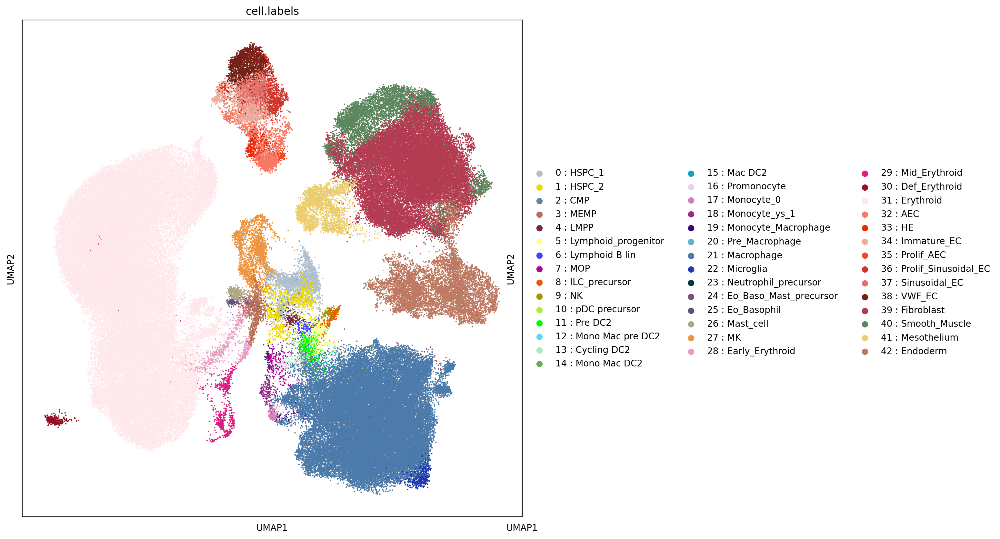

In [7]:
var = "cell.labels"
#Create color dictionary
#cells = ['Endothelium','Progenitors','Erythroid','Endoderm','Macrophage','MK','Mesothelium','Fibroblast','Mast_cell','DC','Monocyte','Granulocyte_precursors','Microglia','Smooth_Muscle','Lymphoid']
col = list(range(0, len(adata.obs[var].unique())))
#col = adata.uns['cell.labels_colors']
dic = dict(zip(cells,col))
#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)
#col_pal = ["#d0352b","#afbfcc","#FFE8EC","#bd7961","#4c7bab","#ee943f","#eccd6e","#b43c52","#b0a789","#6ea85b","#b49fc8","#05394a","#1e38ad","#5c865e","#e0ee71"]
import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this
fig, (ax1, ax2,) = plt.subplots(1,2, figsize=(10,10), gridspec_kw={'wspace':0,'width_ratios': [1,0]})
p2 = sc.pl.umap(adata, color = (var+'_num') ,ax=ax2,show=False,title="", palette= col_pal) #title=i
p3 = sc.pl.umap(adata, color = "num",legend_loc=None,size=10,legend_fontsize='small',ax=ax1,show=False, palette= col_pal, title=var) #title=i
fig.savefig("./figures/main_umap_individual_anno.pdf",bbox_inches='tight')

In [ ]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

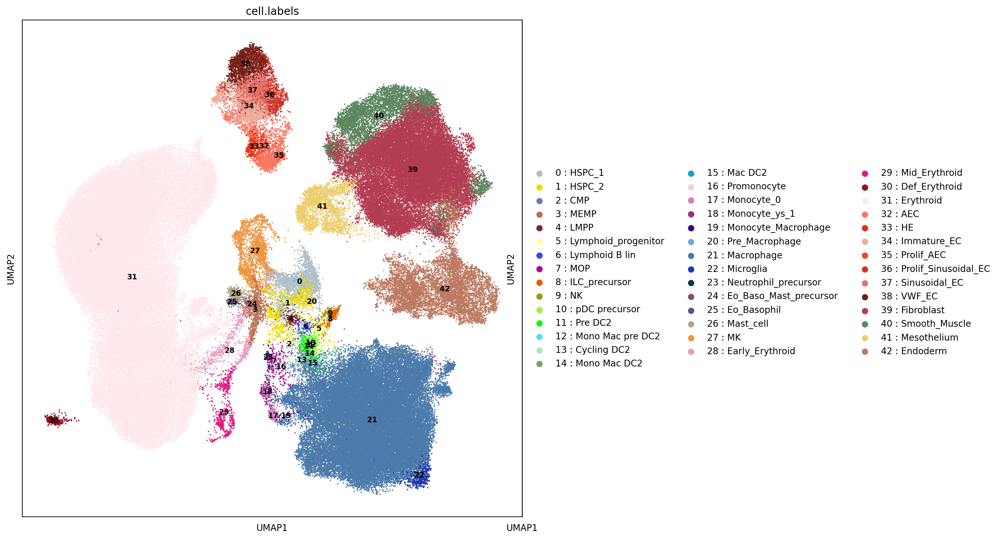

In [8]:
var = "cell.labels"
#Create color dictionary
#cells = ['Endothelium','Progenitors','Erythroid','Endoderm','Macrophage','MK','Mesothelium','Fibroblast','Mast_cell','DC','Monocyte','Granulocyte_precursors','Microglia','Smooth_Muscle','Lymphoid']
col = list(range(0, len(adata.obs[var].unique())))
#col = adata.uns['cell.labels_colors']
dic = dict(zip(cells,col))
#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)
#col_pal = ["#d0352b","#afbfcc","#FFE8EC","#bd7961","#4c7bab","#ee943f","#eccd6e","#b43c52","#b0a789","#6ea85b","#b49fc8","#05394a","#1e38ad","#5c865e","#e0ee71"]
import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this
fig, (ax1, ax2,) = plt.subplots(1,2, figsize=(10,10), gridspec_kw={'wspace':0,'width_ratios': [1,0]})
p2 = sc.pl.umap(adata, color = (var+'_num') ,ax=ax2,show=False,title="", palette= col_pal) #title=i
p3 = sc.pl.umap(adata, color = "num",legend_loc='on data',size=10,legend_fontsize='small',ax=ax1,show=False, palette= col_pal, title=var) #title=i
fig.savefig("./figures/main_umap_individual_anno_with_numbers.pdf",bbox_inches='tight')

In [17]:
data_path = '/lustre/scratch117/cellgen/team298/SharedFolders/ar32/YS/main_data_with_WE_added/A2_V7_scvi_V8_model_selected_raw_qc_scr_umap_with_broad_labels.h5ad'

metadata_input = '' # leave blank if don't want to use

adata = sc.read(data_path)

if len(metadata_input) == 0:
    pass
else:
    metadata = pd.read_csv(metadata_input, index_col=0)
    adata = adata[adata.obs.index.isin(list(metadata.index))]
    adata.obs = metadata

In [ ]:
keys = ['','','']
data_cols = ['cell.labels','cell.label','annot']
col_lookup = dict(zip(keys,data_cols))
indexer_pd = indexer_pd[['dataset_name','fpath']][indexer_pd['dataset_name'].isin([keys])]

#Raw obj paths
data = {
'YS_denovo':'/home/jupyter/mount/gdrive_2/g_cloud/projects/YS/data/A4_V8_YS_integrated_data_singlets_with_raw_counts_for_MS_plotting_20220328_with_obsp.h5ad',
'YS_HM':'/home/jupyter/mount/gdrive_2/g_cloud/projects/YS/data/HM_geo_data/HM_YS_raw_GEO_built_120522.h5ad',
'VA_HM':'/home/jupyter/mount/gdrive_2/g_cloud/projects/YS/data/HM_geo_data/VA_YS_raw_GEO_built_120522.h5ad',
'YS_WE':'/home/jupyter/mount/gdrive_2/g_cloud/projects/YS/data/A1_V1_WE_YS_raw_120522.h5ad',
}


# Read
gene_intersect = {}
adatas = {}
for dataset in data.keys():
    adatas[dataset] = sc.read(data[dataset])
    adatas[dataset].var_names_make_unique()
    adatas[dataset].obs['dataset_merge'] = dataset
    adatas[dataset].obs['dataset_merge'] = dataset
    adatas[dataset].obs['index_orig'] = adatas[dataset].obs.index
    adatas[dataset].obs['chemistry_ver'] = 'V1'
    gene_intersect[dataset] = list(adatas[dataset].var.index)
glist_int = set(gene_intersect['YS_denovo']) & set(gene_intersect['YS_WE'])


adata_raw = list(adatas.values())[0].concatenate(list(adatas.values())[1:],join='inner')

In [ ]:
# where indexer is a dictionary of dataset name and filepath
indexer = {....}
keys = ['','','']
adatas = {}

for key in keys:
    adatas[key] = sc.read(indexer[key])
    adatas[key].obs['orig_dataset'] = key
    


adata_raw = list(adatas.values())[0].concatenate(list(adatas.values())[1:],join='inner')

In [46]:
indexer = pd.read_csv('/lustre/scratch117/cellgen/team298/SharedFolders/YS_proj/Datasets/YS_datasets_indexer.csv', index_col=0)

In [21]:
indexer.loc[key]

Root                            /lustre/scratch117/cellgen/team298/SharedFolde...
Specific Directory              /lustre/scratch117/cellgen/team298/SharedFolde...
Anndata Object Name             A5_fetal_liver_alladata_updated_annots_210721....
Project internal or external                                                 Both
Lane(s)                         ['FCAImmP7179363',\n 'FCAImmP7198630',\n 'FCAI...
Dev_stage                                                                7-17 PCW
Tissue                                                                      Liver
Technology                                                                    10x
Sort_ID                                               ['CD45+', 'CD45-', 'Total']
Additional_metadata                                                            no
Comments                        Rest of Liver which isn't matched age , was re...
Name: Fetal Liver, dtype: object

In [20]:
indexer.loc[key]['Specific Directory']

"/lustre/scratch117/cellgen/team298/SharedFolders/YS_proj/Datasets/A5_fetal_liver_alladata_updated_annots_210721.h5ad'"

In [28]:
indexer = pd.read_csv('/lustre/scratch117/cellgen/team298/SharedFolders/YS_proj/Datasets/YS_datasets_indexer.csv', index_col=0)

keys = [
'Fetal Liver',
'Gastrulation',
'Bing_Zeng AGM',
'Eddie_Crosse AGM',
'Fetal skin',
'Fetal brain',
'FBM',
'Fetal Kidney',
'Adult Liver'
]



adatas={}

for key in keys:
    adatas[key] = sc.read(indexer.loc[key]['Specific Directory'])

/home/jovyan/my-conda-envs/YS_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [39]:
adatas['Fetal brain'].obs

,Object_orig,index_orig_copy,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,nGene,nCounts,percent.mito,n_genes,n_counts,leiden_res1.5
CS14_cortex_cellbender_filtered.h5_GGAGCAAAGGAGCGAG,CS14_cortex_cellbender_filtered.h5,GGAGCAAAGGAGCGAG,11616,9.360225,226741.0,12.331568,28.902580,42.298482,52.123348,62.916279,11616,226741.0,0.024385,11616,226741.0,19
CS14_cortex_cellbender_filtered.h5_CGGACGTAGTCTTGCA,CS14_cortex_cellbender_filtered.h5,CGGACGTAGTCTTGCA,11574,9.356603,222661.0,12.313410,30.026812,43.739137,53.554058,64.024234,11574,222661.0,0.024647,11574,222661.0,19
CS14_cortex_cellbender_filtered.h5_CTAATGGTCAACGGGA,CS14_cortex_cellbender_filtered.h5,CTAATGGTCAACGGGA,10269,9.236982,178071.0,12.089943,28.650370,42.579084,53.333783,65.143679,10269,178071.0,0.024979,10269,178071.0,4
CS14_cortex_cellbender_filtered.h5_CATTCGCTCTGGTGTA,CS14_cortex_cellbender_filtered.h5,CATTCGCTCTGGTGTA,9903,9.200694,171414.0,12.051843,28.917125,43.555369,54.735319,66.647998,9903,171414.0,0.031234,9903,171414.0,4
CS14_cortex_cellbender_filtered.h5_CAAGATCCAGTCGTGC,CS14_cortex_cellbender_filtered.h5,CAAGATCCAGTCGTGC,10627,9.271247,160210.0,11.984247,32.547282,46.338556,56.011485,66.012109,10627,160210.0,0.024137,10627,160210.0,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CS15_1_cellbender_filtered.h5_GCGCAGTGTACCCAAT,CS15_1_cellbender_filtered.h5,GCGCAGTGTACCCAAT,226,5.424950,308.0,5.733341,42.207792,59.090909,91.558442,100.000000,226,308.0,0.000000,226,308.0,0
CS15_1_cellbender_filtered.h5_CTCGTCATCATTCACT,CS15_1_cellbender_filtered.h5,CTCGTCATCATTCACT,244,5.501258,320.0,5.771441,39.375000,55.000000,86.250000,100.000000,244,320.0,0.000000,244,320.0,0
CS15_1_cellbender_filtered.h5_CCTCAGTGTATCGCAT,CS15_1_cellbender_filtered.h5,CCTCAGTGTATCGCAT,228,5.433722,336.0,5.820083,45.833333,61.904762,91.666667,100.000000,228,336.0,0.002976,228,336.0,16
CS15_1_cellbender_filtered.h5_AAAGATGGTCCGACGT,CS15_1_cellbender_filtered.h5,AAAGATGGTCCGACGT,258,5.556828,335.0,5.817111,37.910448,52.835821,82.686567,100.000000,258,335.0,0.005970,258,335.0,0


In [34]:
adatas['Eddie_Crosse AGM'].obs['cell_types_num'].value_counts()

0 : 1_Endo1_GJAhi             476
2 : 2_Endo2_APLNRhi           457
8 : 3                         295
20 : 6                        137
3 : 11_Hem_MYE                126
10 : 5                        117
1 : 17_EPCAM                  108
7 : 4                         104
6 : 8                          79
11 : 12_Mesenchymal            78
5 : 18_EPCAM                   64
4 : 9                          64
14 : 7                         58
17 : 19_EPCAM                  45
19 : NaN                       42
16 : 15_Mesenchymal            39
15 : 14_Mesenchymal_Peri       37
18 : 10_HSPC                   28
9 : 16_SNS_sympathoadrenal     27
13 : 13_Mesenchymal            24
12 : 20_PGC_Primordial         16
Name: cell_types_num, dtype: int64

In [37]:
adatas['Fetal Liver'].obs

,nGene,nUMI,orig.ident,percent.mito,fetal.ids,sort.ids,tissue,lanes,stages,sample.type,...,doublets,cell.labels,combined.labels,batch,sample,n_counts,cell.labels_progen,cell.labels_submission,cell.labels_back,cell.labels_bm_barplot
index,,,,,,,,,,,,,,,,,,,,,
F21_liver_CD45+_FCAImmP7179363_AAACCTGAGCAGATCG,2880,12998,F21,0.030389,F21_male_16+2PCW,CD45+,liver,FCAImmP7179363,Stage 4,medical,...,Singlet,Kupffer Cell,Kupffer Cell_liver,5,FCAImmP7179363,12998,NaN,Kupffer Cell,Kupffer Cell,Kupffer Cell
F21_liver_CD45+_FCAImmP7179363_AAGACCTGTGGCAAAC,2276,8431,F21,0.041513,F21_male_16+2PCW,CD45+,liver,FCAImmP7179363,Stage 4,medical,...,Singlet,Kupffer Cell,Kupffer Cell_liver,5,FCAImmP7179363,8431,NaN,Kupffer Cell,Kupffer Cell,Kupffer Cell
F21_liver_CD45+_FCAImmP7179363_AATCGGTCAATGTAAG,2260,8904,F21,0.030436,F21_male_16+2PCW,CD45+,liver,FCAImmP7179363,Stage 4,medical,...,Singlet,Kupffer Cell,Kupffer Cell_liver,5,FCAImmP7179363,8904,NaN,Kupffer Cell,Kupffer Cell,Kupffer Cell
F21_liver_CD45+_FCAImmP7179363_AATCGGTCAATTGCTG,2207,9015,F21,0.052246,F21_male_16+2PCW,CD45+,liver,FCAImmP7179363,Stage 4,medical,...,Singlet,Kupffer Cell,Kupffer Cell_liver,5,FCAImmP7179363,9015,NaN,Kupffer Cell,Kupffer Cell,Kupffer Cell
F21_liver_CD45+_FCAImmP7179363_ACCTTTAGTGAAATCA,4336,26645,F21,0.046087,F21_male_16+2PCW,CD45+,liver,FCAImmP7179363,Stage 4,medical,...,Singlet,Kupffer Cell,Kupffer Cell_liver,5,FCAImmP7179363,26645,NaN,Kupffer Cell,Kupffer Cell,Kupffer Cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F45_liver_CD45-_FCAImmP7579223_TGCACCTGTCTTTCAT,2456,7972,F45,0.036001,F45_female_13+6PCW,CD45-,liver,FCAImmP7579223,Stage 3,medical,...,Singlet,Fibroblast,Fibroblast_liver,39,FCAImmP7579223,7972,NaN,Fibroblast,Fibroblast,Fibroblast
F45_liver_CD45-_FCAImmP7579223_TGGCGCACAGCCACCA,3354,13047,F45,0.030505,F45_female_13+6PCW,CD45-,liver,FCAImmP7579223,Stage 3,medical,...,Singlet,Fibroblast,Fibroblast_liver,39,FCAImmP7579223,13047,NaN,Fibroblast,Fibroblast,Fibroblast
F45_liver_CD45-_FCAImmP7579223_TTAGGACGTCTGCAAT,2413,8360,F45,0.021773,F45_female_13+6PCW,CD45-,liver,FCAImmP7579223,Stage 3,medical,...,Singlet,Fibroblast,Fibroblast_liver,39,FCAImmP7579223,8359,NaN,Fibroblast,Fibroblast,Fibroblast


In [ ]:
adatas['Fetal Liver'].obs.columns

In [24]:
adatas

{'Fetal Liver': AnnData object with n_obs × n_vars = 113063 × 27080
     obs: 'nGene', 'nUMI', 'orig.ident', 'percent.mito', 'fetal.ids', 'sort.ids', 'tissue', 'lanes', 'stages', 'sample.type', 'gender', 'AnnatomicalPart', 'doublets', 'cell.labels', 'combined.labels', 'batch', 'sample', 'n_counts', 'cell.labels_progen', 'cell.labels_submission', 'cell.labels_back', 'cell.labels_bm_barplot'
     obsm: 'X_fdg', 'X_tsne', 'X_umap',
 'Gastrulation': AnnData object with n_obs × n_vars = 294 × 57591
     obs: 'Unnamed: 0', 'X0', 'X1', 'cluster_id', 'sub_cluster', 'cluster', 'origin', 'size_factor', 'celltype_origin', 'batch', 'n_counts', 'tissue', 'lr_batch', 'corr_concat', 'cell.labels', 'stage', 'lanes', 'sex', 'sort.ids', 'fetal.ids', 'component', 'broad_cell.labels', 'sequencing.type', 'orig.dataset', 'broad_cell_labels_organ', 'V6_old_indexes'
     obsm: 'X_umap'}

In [27]:
adatas['Fetal Liver'].obs.columns

Index(['nGene', 'nUMI', 'orig.ident', 'percent.mito', 'fetal.ids', 'sort.ids',
       'tissue', 'lanes', 'stages', 'sample.type', 'gender', 'AnnatomicalPart',
       'doublets', 'cell.labels', 'combined.labels', 'batch', 'sample',
       'n_counts', 'cell.labels_progen', 'cell.labels_submission',
       'cell.labels_back', 'cell.labels_bm_barplot'],
      dtype='object')

In [42]:
ss2 = sc.read('/lustre/scratch117/cellgen/team298/SharedFolders/YS_proj/Datasets/updated_ss2_data.h5ad')

In [45]:
ss2.X.max()

9.193654

In [ ]:
/lustre/scratch117/cellgen/team298/SharedFolders/ar32/YS/main_data_with_WE_added/temp_combined_YS_EL_no_obsm_raw_20220519.h5ad

In [ ]:
/lustre/scratch117/cellgen/team298/SharedFolders/YS_proj/Datasets/Original_data_sets_before_ammendments

In [ ]:
clara datasets use ‘LR_assignment_v2’

In [2]:
import os
import sys
%matplotlib inline
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import datetime

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=300, dpi_save=300)

In [3]:
FL = sc.read('/lustre/scratch117/cellgen/team298/SharedFolders/YS_proj/Datasets/A5_fetal_liver_alladata_updated_annots_210721.h5ad')

In [5]:
FL.obs['orig.ident'].value_counts()

F33    16945
F34    15401
F22     9958
F30     9730
F38     9425
F35     8821
F45     8369
F41     6904
F32     6753
F21     6657
F23     5658
F29     5315
F17     1992
F16     1135
Name: orig.ident, dtype: int64

In [ ]:
'F61', 'F35', 'F32'

In [6]:
check = sc.read('/lustre/scratch117/cellgen/team298/SharedFolders/ar32/YS/main_data_with_WE_added/temp_combined_YS_EL_no_obsm_raw_20220519.h5ad')

In [11]:
check.obs['fetal.ids'].value_counts()

F61          78748
F79          40585
F138         31680
F80          21246
F37          10729
F35          10682
F32           8275
Wang_CS11     7054
mikola_1      6256
Wang_CS10     3615
Name: fetal.ids, dtype: int64

# Import packages

In [1]:
import os
import sys
%matplotlib inline
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import datetime

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=300, dpi_save=300)

# input data and metadata

In [2]:
data_path = '/lustre/scratch126/cellgen/team298/SharedFolders/ar32/YS/main_data_with_WE_added/A2_V7_scvi_V8_model_selected_raw_qc_scr_umap_with_broad_labels.h5ad'

metadata_input = '' # leave blank if don't want to use

adata = sc.read(data_path)

if len(metadata_input) == 0:
    pass
else:
    metadata = pd.read_csv(metadata_input, index_col=0)
    adata = adata[adata.obs.index.isin(list(metadata.index))]
    adata.obs = metadata

# Update metadata

In [3]:
adata.obs['orig.dataset_updated'] = adata.obs['orig.dataset'].astype(str)
adata.obs.loc[adata.obs['fetal.ids'].isin(['F61']), 'orig.dataset_updated'] = 'Suo_et_al_BioRxiv_2022'
adata.obs.groupby(['orig.dataset_updated','fetal.ids']).apply(len)

orig.dataset_updated            fetal.ids
De_novo                         F79          40585
                                F80          21246
HM_YS                           mikola_1      6256
Popescu_et_al_Nature_2019       F32           1001
                                F35           1383
                                F37          10729
Suo_et_al_BioRxiv_2022          F61          45945
WE_YS                           F138         31680
Wang_et_al_Cell_Stem Cell_2021  Wang_CS10     3615
                                Wang_CS11     7054
dtype: int64

In [4]:
adata.obs

,cell.labels,stage,lanes,sex,sort.ids,fetal.ids,component,broad_cell.labels,sequencing.type,orig.dataset,...,scrublet_cluster_score,scr_bh_pval,scr_pval,scr_doublet_call_default,scrublet_leiden_R,cell.labels_150522,cell.labels_170522,cell.labels_170522_v2,legacy_broad_cell.labels_20220519,orig.dataset_updated
Wang_et_al_AAACCTGAGACCTTTG_1-0,Sinusoidal_EC,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Endothelium,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.0423854742729176,0.6366900113321482,0.6171107923422262,False,24,Sinusoidal_EC,Sinusoidal_EC,Sinusoidal_EC,Endothelium,Wang_et_al_Cell_Stem Cell_2021
Wang_et_al_AAACCTGCACTTAAGC_1-0,HSPC_1,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Progenitors,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.0586383751745655,0.6244055653490671,0.5479319441286481,False,43,HSPC_1,HSPC_1,HSPC_1,Progenitors,Wang_et_al_Cell_Stem Cell_2021
Wang_et_al_AAACCTGGTAACGACG_1-0,Erythroid,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Erythroid,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.1354690173326213,0.61932607607061,0.2362351062026815,False,83,Erythroid,Erythroid,Erythroid,Erythroid,Wang_et_al_Cell_Stem Cell_2021
Wang_et_al_AAACCTGGTCAAAGAT_1-0,Erythroid,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Erythroid,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.0423599269505426,0.6366900113321482,0.6172172420068612,False,33,Erythroid,Erythroid,Erythroid,Erythroid,Wang_et_al_Cell_Stem Cell_2021
Wang_et_al_AAACCTGGTCCGAAGA_1-0,Erythroid,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Erythroid,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.1063233068103143,0.6244055653490671,0.3444944990026546,False,3,Erythroid,Erythroid,Erythroid,Erythroid,Wang_et_al_Cell_Stem Cell_2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCTCTAGC-1-5-3,Fibroblast,CS17,WS_wEMB12142161,Female,Total,F138,VA,Fibroblast,5GEX,WE_YS,...,0.0827387933178495,0.8014470983258809,0.5,False,20,Fibroblast,Fibroblast,Fibroblast,NaN,WE_YS
TTTGTCATCGCCGTGA-1-5-3,Erythroid,CS17,WS_wEMB12142161,Female,Total,F138,VA,Erythroid,5GEX,WE_YS,...,0.0620154232883659,0.8014470983258809,0.6470753499202656,False,18,Erythroid,Erythroid,Erythroid,NaN,WE_YS
TTTGTCATCGTTTAGG-1-5-3,Macrophage,CS17,WS_wEMB12142161,Female,Total,F138,VA,Macrophage,5GEX,WE_YS,...,0.0468525611080233,0.807620054295302,0.7433148644147297,False,26,Macrophage,Macrophage,Macrophage,NaN,WE_YS
TTTGTCATCTGACCTC-1-5-3,Fibroblast,CS17,WS_wEMB12142161,Female,Total,F138,VA,Fibroblast,5GEX,WE_YS,...,0.0853812746199781,0.8014470983258809,0.4808072243000471,False,12,Fibroblast,Fibroblast,Fibroblast,NaN,WE_YS


In [5]:
adata.obs['cell.labels'].unique()

['Sinusoidal_EC', 'HSPC_1', 'Erythroid', 'Early_Erythroid', 'Endoderm', ..., 'Eo_Basophil', 'pDC precursor', 'Cycling DC2', 'HE', 'Mac DC2']
Length: 43
Categories (43, object): ['AEC', 'CMP', 'Cycling DC2', 'Def_Erythroid', ..., 'Sinusoidal_EC', 'Smooth_Muscle', 'VWF_EC', 'pDC precursor']

In [6]:
collapse = ['Mono Mac pre DC2',
'Cycling DC2',
'Mono Mac DC2',
'Mac DC2',]

adata.obs['cell.labels'] = adata.obs['cell.labels'].astype(str)

for anno in collapse:
    adata.obs.loc[adata.obs['cell.labels'] == anno, 'cell.labels'] = 'ysDC'
    
adata.obs.loc[adata.obs['cell.labels'] == 'Monocyte_0', 'cell.labels'] = 'Monocyte_1'
adata.obs.loc[adata.obs['cell.labels'] == 'Monocyte_ys_1', 'cell.labels'] = 'Monocyte_2'

In [7]:
cells = [
'HSPC_1',
'HSPC_2',
'CMP',
'MEMP',
'LMPP',
'Lymphoid_progenitor',
    
    'Lymphoid B lin', # new anno
    
'MOP',
'ILC_precursor',
'NK',
'pDC precursor',
'Pre DC2',
#'Mono Mac pre DC2',
#'Cycling DC2',
#'Mono Mac DC2',
#'Mac DC2',

'ysDC',

'Promonocyte',
#'Monocyte',
#'Monocyte_0',
#'Monocyte_ys_1',
'Monocyte_1',
'Monocyte_2',
    
'Monocyte_Macrophage',
'Pre_Macrophage',
'Macrophage',
'Microglia',
'Neutrophil_precursor',
'Eo_Baso_Mast_precursor',
'Eo_Basophil',
'Mast_cell',
'MK',
'Early_Erythroid',
    
    'Mid_Erythroid', # new anno
    'Def_Erythroid', # new anno
    
'Erythroid',
'AEC',
'HE',
'Immature_EC',
'Prolif_AEC',
'Prolif_Sinusoidal_EC',
'Sinusoidal_EC',
'VWF_EC',
'Fibroblast',
'Smooth_Muscle',
'Mesothelium',
'Endoderm', 
]

col_pal = [
'#afbfcc',
'#F0DB00',
'#67839c',
'#b87056',
'#7a2839',
'#FFFF99',
    
    '#4040FF', # new colour
    
'#AB0890',
'#F25602',
'#9b9b00',
'#a6ee39',
'#00FF00',
#'#53DDF3',
#'#a9e9b9',
#'#6ea85b',
#'#0DA6BE',
    
'#6ea85b',                           #'#5AA850',  # from emily                       # #4E7740'from liver which should be equivalent colors
    
'#e7d4e7',
#'#b49fc8', # Original Monocyte colour
'#D27EBD',  # eye drop from 4a
'#9A278B',  # eye drop from 4a
    
'#3e007c',
'#66b1d2',
'#4c7bab',
'#1e38ad',
'#05394a',
'#814f75',
'#634f81',
'#b0a789',
'#ee943f',
'#ea9bc2',
    
    '#E21A84', # new colour
    '#930F23', # new colour
    
'#FFE8EC',
    
'#f97864',
'#eb2a0a',
'#edad9d',
'#f64528',
'#D0352B',
'#E1736C',
'#752017',
'#b43c52',
'#5c865e',
'#eccd6e',
'#bd7961',
]

In [8]:
dict1 = dict(zip(cells,col_pal))

In [9]:
dict1

{'HSPC_1': '#afbfcc',
 'HSPC_2': '#F0DB00',
 'CMP': '#67839c',
 'MEMP': '#b87056',
 'LMPP': '#7a2839',
 'Lymphoid_progenitor': '#FFFF99',
 'Lymphoid B lin': '#4040FF',
 'MOP': '#AB0890',
 'ILC_precursor': '#F25602',
 'NK': '#9b9b00',
 'pDC precursor': '#a6ee39',
 'Pre DC2': '#00FF00',
 'ysDC': '#6ea85b',
 'Promonocyte': '#e7d4e7',
 'Monocyte_1': '#D27EBD',
 'Monocyte_2': '#9A278B',
 'Monocyte_Macrophage': '#3e007c',
 'Pre_Macrophage': '#66b1d2',
 'Macrophage': '#4c7bab',
 'Microglia': '#1e38ad',
 'Neutrophil_precursor': '#05394a',
 'Eo_Baso_Mast_precursor': '#814f75',
 'Eo_Basophil': '#634f81',
 'Mast_cell': '#b0a789',
 'MK': '#ee943f',
 'Early_Erythroid': '#ea9bc2',
 'Mid_Erythroid': '#E21A84',
 'Def_Erythroid': '#930F23',
 'Erythroid': '#FFE8EC',
 'AEC': '#f97864',
 'HE': '#eb2a0a',
 'Immature_EC': '#edad9d',
 'Prolif_AEC': '#f64528',
 'Prolif_Sinusoidal_EC': '#D0352B',
 'Sinusoidal_EC': '#E1736C',
 'VWF_EC': '#752017',
 'Fibroblast': '#b43c52',
 'Smooth_Muscle': '#5c865e',
 'Mesothe

In [10]:
len(cells)

40

In [11]:
len(col_pal)

40

In [12]:
len(adata.obs['cell.labels'].unique())

40

In [13]:
df = pd.DataFrame(columns=['Cells','Col_pal'])

In [14]:
df['Cells'] = cells
df['Col_pal'] = col_pal

In [15]:
df

,Cells,Col_pal
0,HSPC_1,#afbfcc
1,HSPC_2,#F0DB00
2,CMP,#67839c
3,MEMP,#b87056
4,LMPP,#7a2839
5,Lymphoid_progenitor,#FFFF99
6,Lymphoid B lin,#4040FF
7,MOP,#AB0890
8,ILC_precursor,#F25602
9,NK,#9b9b00


In [16]:
adata.obs['cell.labels'].value_counts()

Erythroid                 61038
Macrophage                44413
Fibroblast                28730
Endoderm                   7656
Smooth_Muscle              5106
Mesothelium                2750
HSPC_1                     2158
MK                         2044
Sinusoidal_EC              1772
AEC                        1707
VWF_EC                     1620
Immature_EC                1486
Prolif_Sinusoidal_EC       1219
HSPC_2                      982
MEMP                        762
Early_Erythroid             699
Mid_Erythroid               638
Microglia                   613
Lymphoid_progenitor         605
Mast_cell                   354
HE                          314
ysDC                        308
Def_Erythroid               289
Pre DC2                     238
MOP                         211
Monocyte_1                  200
ILC_precursor               185
Prolif_AEC                  181
Monocyte_2                  176
NK                          170
LMPP                        169
Lymphoid

In [17]:
len(cells)

40

In [18]:
len(adata.obs['cell.labels'].unique())

40

In [19]:
adata.obs['cell.labels'] = adata.obs['cell.labels'].astype('category')
adata.obs['cell.labels'] = adata.obs['cell.labels'].cat.reorder_categories(cells)

In [20]:
#plt.rcParams['svg.fonttype'] = 'none'
#plt.rcParams['pdf.fonttype'] = 42
#plt.rcParams['ps.fonttype'] = 42

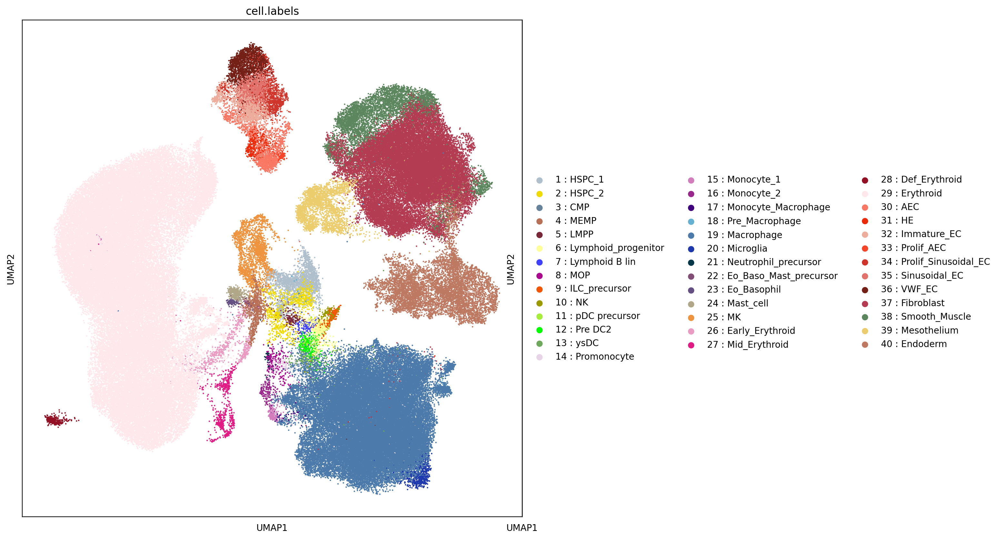

In [21]:
var = "cell.labels"
#Create color dictionary
#cells = ['Endothelium','Progenitors','Erythroid','Endoderm','Macrophage','MK','Mesothelium','Fibroblast','Mast_cell','DC','Monocyte','Granulocyte_precursors','Microglia','Smooth_Muscle','Lymphoid']
col = list(range(1, len(adata.obs[var].unique())+1))
#col = adata.uns['cell.labels_colors']
dic = dict(zip(cells,col))
#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)
#col_pal = ["#d0352b","#afbfcc","#FFE8EC","#bd7961","#4c7bab","#ee943f","#eccd6e","#b43c52","#b0a789","#6ea85b","#b49fc8","#05394a","#1e38ad","#5c865e","#e0ee71"]
import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this
fig, (ax1, ax2,) = plt.subplots(1,2, figsize=(10,10), gridspec_kw={'wspace':0,'width_ratios': [1,0]})
p2 = sc.pl.umap(adata, color = (var+'_num') ,ax=ax2,show=False,title="", palette= col_pal) #title=i
p3 = sc.pl.umap(adata, color = "num",legend_loc=None,size=10,legend_fontsize='small',ax=ax1,show=False, palette= col_pal, title=var) #title=i
fig.savefig("./figures/main_umap_individual_anno_collapsed_DC_fraction_20230417.pdf",bbox_inches='tight',format=None, metadata=None,backend=None)

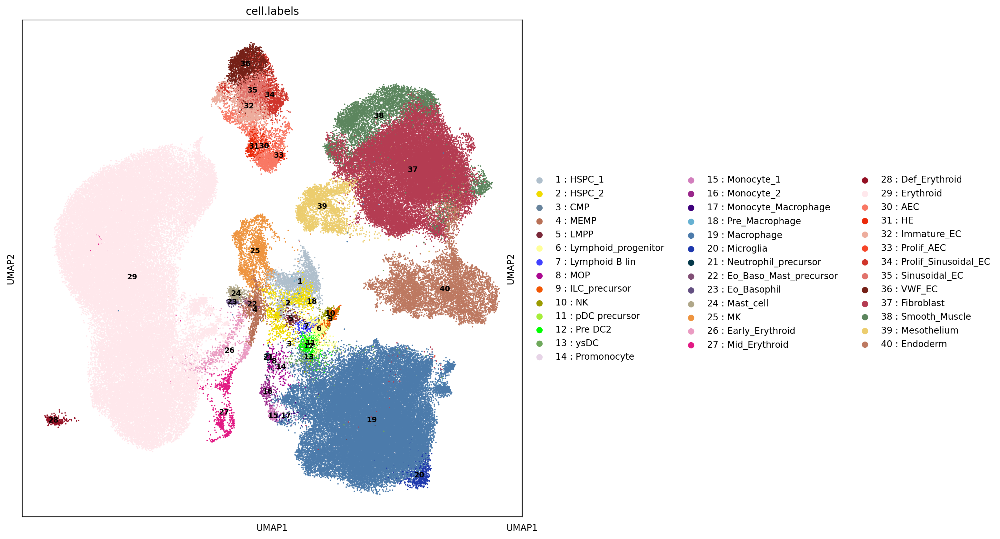

In [22]:
var = "cell.labels"
#Create color dictionary
#cells = ['Endothelium','Progenitors','Erythroid','Endoderm','Macrophage','MK','Mesothelium','Fibroblast','Mast_cell','DC','Monocyte','Granulocyte_precursors','Microglia','Smooth_Muscle','Lymphoid']
col = list(range(1, len(adata.obs[var].unique())+1))
#col = adata.uns['cell.labels_colors']
dic = dict(zip(cells,col))
#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)
#col_pal = ["#d0352b","#afbfcc","#FFE8EC","#bd7961","#4c7bab","#ee943f","#eccd6e","#b43c52","#b0a789","#6ea85b","#b49fc8","#05394a","#1e38ad","#5c865e","#e0ee71"]
import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this
fig, (ax1, ax2,) = plt.subplots(1,2, figsize=(10,10), gridspec_kw={'wspace':0,'width_ratios': [1,0]})
p2 = sc.pl.umap(adata, color = (var+'_num') ,ax=ax2,show=False,title="", palette= col_pal) #title=i
p3 = sc.pl.umap(adata, color = "num",legend_loc='on data',size=10,legend_fontsize='small',ax=ax1,show=False, palette= col_pal, title=var) #title=i
fig.savefig("./figures/main_umap_individual_anno_with_numbers_collapsed_DC_fraction_20230417.pdf",bbox_inches='tight',format=None, metadata=None,backend=None)

